# Resultados para o artigo da disciplina de Hidrologia II

In [274]:
from hydrocomp.series import flow
import plotly.offline as plt
import pandas as pd

### Dados

In [279]:
# Obtenção dos dados de vazão usado a biblioteca hydrocomp.
stations = ['76100000', '76310000', '76380000', '76440000', '76460000', '76750000', '76800000']

df_flow = flow.Flow(path_file=stations, source='ANA', consistence=1)
df_flow.data.head()

,76100000,76310000,76380000,76440000,76460000,76750000,76800000
Date,,,,,,,
1940-04-01,NaN,NaN,45.6,NaN,NaN,NaN,NaN
1940-04-02,NaN,NaN,24.3,NaN,NaN,NaN,NaN
1940-04-03,NaN,NaN,15.6,NaN,NaN,NaN,NaN
1940-04-04,NaN,NaN,14.1,NaN,NaN,NaN,NaN
1940-04-05,NaN,NaN,11.2,NaN,NaN,NaN,NaN


### Gráficos

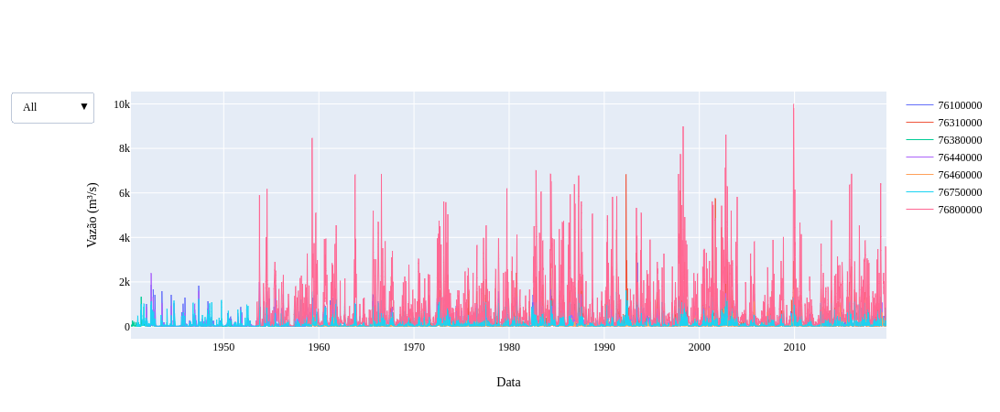

In [280]:
fig, data = df_flow.plot_hydrogram('')
plt.iplot(fig)

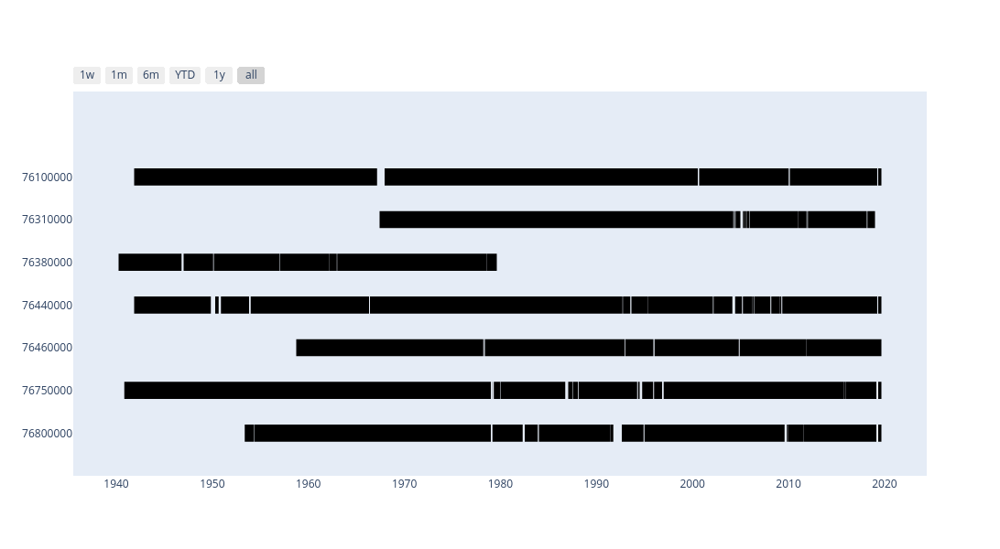

In [281]:
fig, data = df_flow.gantt('')
plt.iplot(fig)

In [282]:
### Definição do período de dados
df_flow.date(date_start='1/1/1968', date_end='31/12/1977')
df_flow.data.isnull().sum()

76100000    0
76310000    0
76380000    0
76440000    0
76460000    0
76750000    0
76800000    0
dtype: int64

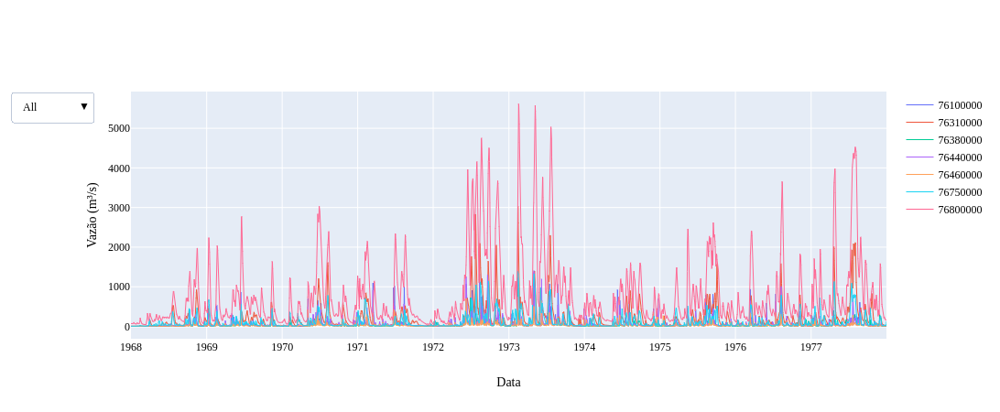

In [283]:
fig, data = df_flow.plot_hydrogram('')
plt.iplot(fig)

### Vazão máxima diaria

In [284]:
qmax = pd.DataFrame(df_flow.data.max(), columns=['qmax'])
qmax.index.names = ['Estacao']
qmax

,qmax
Estacao,
76100000,1402.53
76310000,3022.98
76380000,940.00
76440000,1382.00
76460000,732.30
76750000,1388.99
76800000,5614.51


### Informações das bacias

In [285]:
df_inf = pd.read_csv('df_inf.csv', ';', header=0, dtype={'Estacao': str}).rename(columns={'Area de Drenagem': 'AD', 'Comprimento do maior rio': 'CR', 'Densidade de drenagem': 'DD', 'Inclinacao Media':'S'})
df_inf.index = df_inf['Estacao']
df_inf.drop('Estacao', axis=1, inplace=True)

In [286]:
df_inf['Q'] = qmax['qmax'].divide(df_inf['AD'])
df_inf

,AD,CR,DD,S,Q
Estacao,,,,,
76100000,2939.69,95.581683,0.032514,0.091734,0.477101
76310000,12763.35,188.169869,0.014743,0.043672,0.236848
76380000,1919.07,55.063396,0.028693,0.047851,0.489821
76440000,2446.81,124.995047,0.051085,0.074900,0.564817
76460000,967.46,17.194706,0.017773,0.074319,0.756931
76750000,6324.20,150.717788,0.023832,0.061591,0.219631
76800000,45015.57,443.627226,0.009855,0.056022,0.124724


In [287]:
from matplotlib import pyplot as plt
from sklearn.datasets.samples_generator import make_blobs
from sklearn.cluster import KMeans
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA

In [367]:
features = ['AD', 'CR', 'DD', 'S', 'Q']
x = df_inf.loc[:, features].values
y = df_inf.index.values

In [379]:
pca = PCA(n_components='mle')
principalComponents = pca.inverse_transform(pca.fit_transform(x))
principalDf = pd.DataFrame(data =principalComponents, index=y)

In [380]:
principalDf

,0,1,2,3,4
76100000,2939.69,95.581690,0.031168,0.068228,0.479130
76310000,12763.35,188.169864,0.020509,0.054843,0.235573
76380000,1919.07,55.063396,0.019251,0.059622,0.489420
76440000,2446.81,124.995045,0.049476,0.084575,0.564114
76460000,967.46,17.194704,0.023764,0.072913,0.756683
76750000,6324.20,150.717789,0.025955,0.055687,0.219991
76800000,45015.57,443.627227,0.008371,0.054222,0.124963


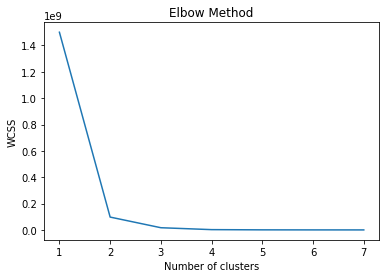

In [383]:
wcss = []
for i in range(1, 8):
    kmeans = KMeans(n_clusters=i, init='k-means++', max_iter=300, n_init=1, random_state=0)
    kmeans.fit(principalDf)
    wcss.append(kmeans.inertia_)
plt.plot(range(1, 8), wcss)
plt.title('Elbow Method')
plt.xlabel('Number of clusters')
plt.ylabel('WCSS')
plt.show()

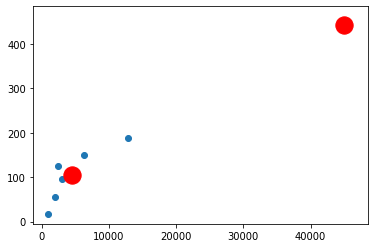

In [415]:
kmeans = KMeans(n_clusters=2, init='k-means++', max_iter=300, n_init=1, random_state=0)
pred_y = kmeans.fit_predict(principalDf)
plt.scatter(x[:,0], x[:,1])
plt.scatter(kmeans.cluster_centers_[:, 0], kmeans.cluster_centers_[:, 1], s=300, c='red')
plt.show()

In [391]:
kmeans.cluster_centers_

array([[4.56009667e+03, 1.05287081e+02, 2.83540034e-02, 6.59779450e-02,
        4.57484932e-01],
       [4.50155700e+04, 4.43627227e+02, 8.37087985e-03, 5.42218912e-02,
        1.24963046e-01]])